In [48]:
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from skimage.feature import hog

In [37]:
def preprocess(img):
    
    plt.imshow(img)
    plt.show()
    
    img = img[:,:,2]
    w,h = img.shape
    plt.imshow(img,cmap='gray')
    plt.show()
    thresh = np.mean(im[h//2 - 5:h//2 + 5,w//2 - 5:w//2 + 5])
    ret,img = cv2.threshold(img,thresh+40,255,cv2.THRESH_BINARY)
    kernel = np.ones((10,10),np.uint8)
    img = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
    img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    img = cv2.dilate(img,kernel,iterations = 1)
    contours, hierarchy = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x: cv2.contourArea(x))
    x,y,w,h = cv2.boundingRect(cntsSorted[0])
    cropped = img[y:y+h,x:x+w]
    plt.imshow(img,cmap='gray')
    plt.show()
    return cropped
    
    
def get_hu_feature(img):
    
    #plt.imshow(cropped,cmap='gray')
    #plt.show()
    return cv2.HuMoments(cv2.moments(img)).flatten().tolist()
    
    

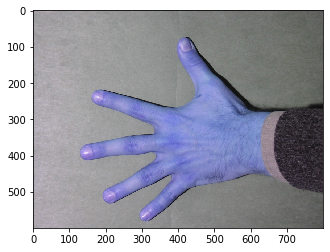

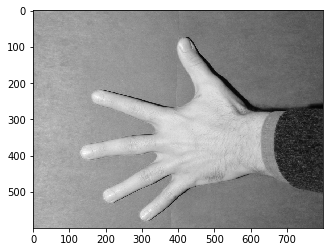

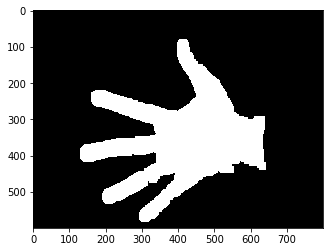

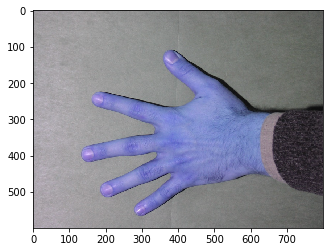

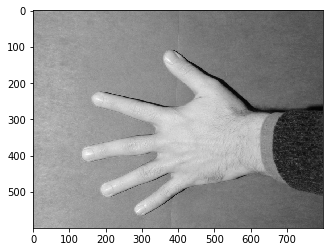

...

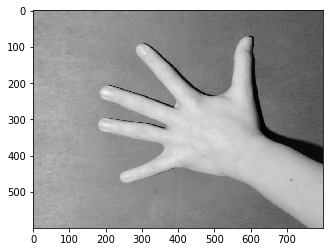

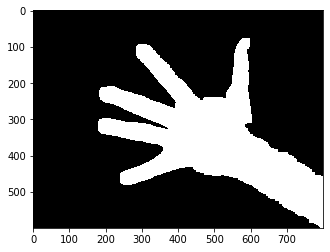

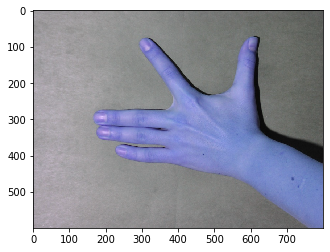

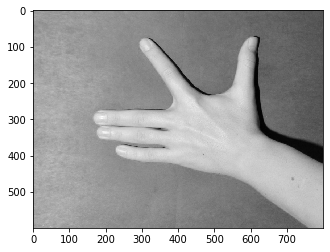

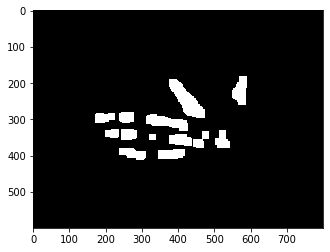

In [38]:
X = []
for file in os.scandir("./images"):
    
    im = cv2.imread(file.path)
    im = preprocess(im)
    features = get_hu_feature(im)
    features.append(file.path)
    #print(features)
    X.append(features)
    
    #break
    
data = pd.DataFrame(X)
data.to_csv("data.csv",index=False)

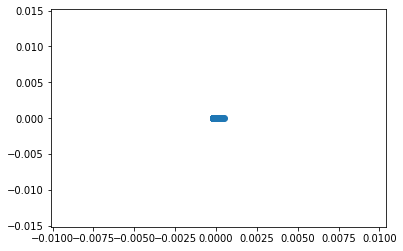

In [39]:
from sklearn.decomposition import PCA


X = data.iloc[:,:-1]
filenames = data.iloc[:,-1]

pca = PCA(n_components=2)
X_r = pca.fit(X).transform(X)

plt.scatter(X_r[:,0],X_r[:,1])

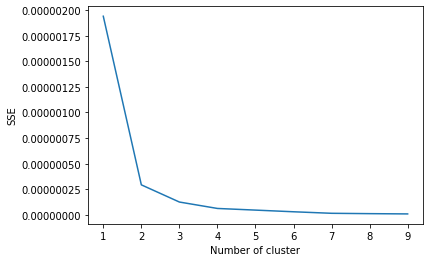

In [40]:
from sklearn.cluster import KMeans
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(X)
    data["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [41]:
kmeans = KMeans(n_clusters=3, init = 'k-means++', max_iter=1000).fit(X)
predictions = kmeans.predict(X)
print(predictions)

[2 0 0 0 2 0 0 2 2 2 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 1 2 1 1 0 1 0 1 1
 1 1 0]


In [42]:
clusters = {0:[],1:[],2:[]}

for (filename,index) in zip(filenames,predictions):
    clusters[index].append(filename)

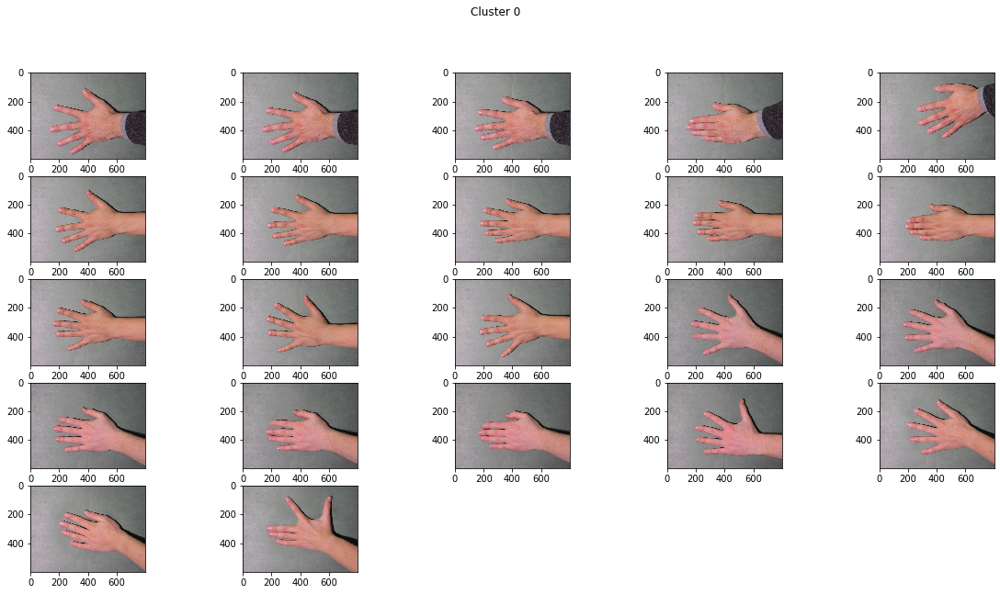

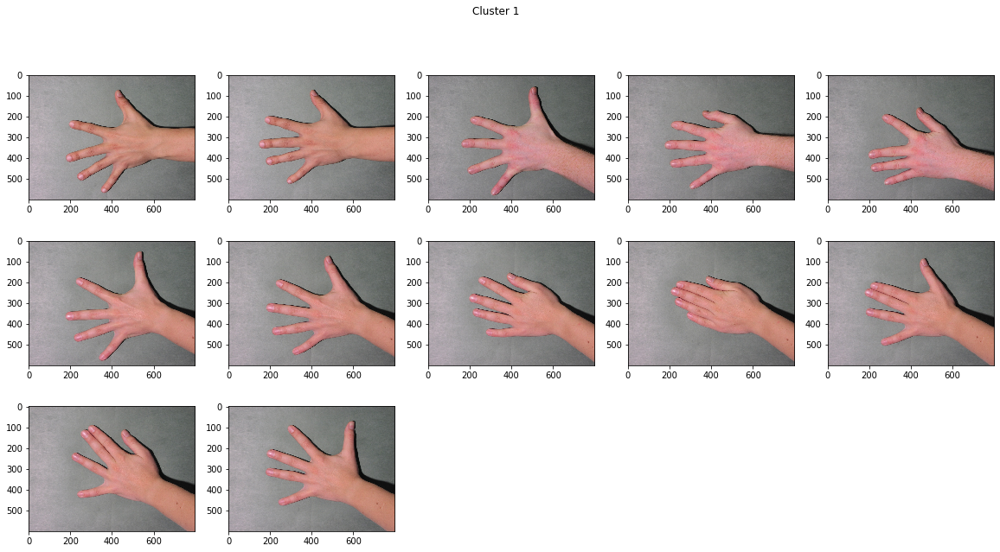

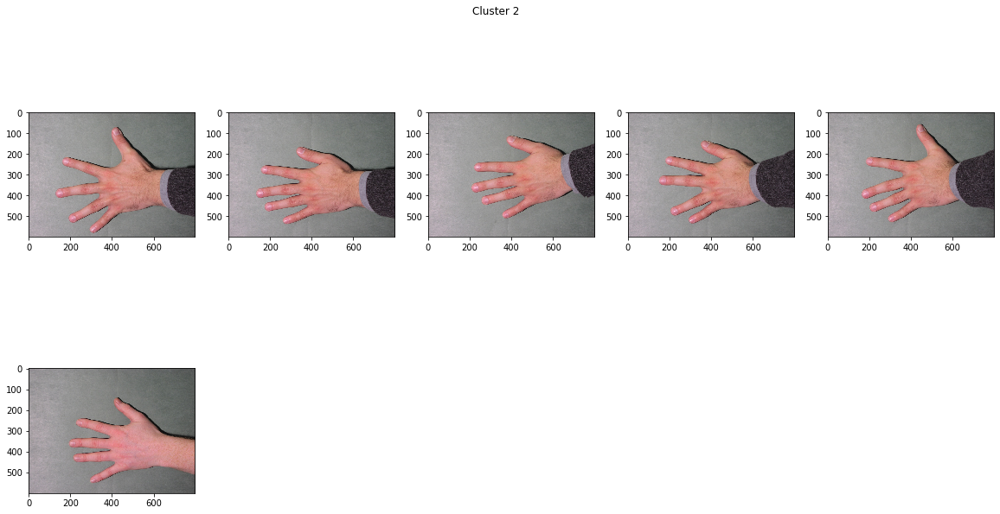

In [43]:
import math
for index,flist in clusters.items():
    
    plt.figure(figsize = (20,10))
    for i,path in enumerate(flist):
        plt.subplot(len(flist)//5 + 1, 5, i+1)
        img=cv2.imread(path,cv2.IMREAD_UNCHANGED)
        img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        
    plt.suptitle('Cluster '+str(index))
    plt.show()
    